# Условие

1. Собрать данные.
   - Процентные ставки на разные сроки (от 0 до 30 лет) за период с 1 января 2015 г. по 1 января 2023 г.
   - Описания 5 государственных облигаций РФ (расписания выплат). Критерии — государственные облигации с полностью известными размерами выплат (не привязанные к показателям), без оферт, со сроком погашения после 1 января 2023 г.:
   - Рыночные котировки этих облигаций за период с 1 января 2015 г. по 1 января 2023 г.
   - Котировки 10 акций за тот же период.
   - Значения индекса ММВБ, индекса РТС, цены на нефть Brent и курса доллара и евро за тот же период.
   - Котировки фьючерса и опционов на фьючерс на один выбранный актив из предыдущего пункта — выбрать один торговый день за 2022 год. Срок погашения и фьючерса, и опционов взять ближайшие к выбранному дню, но не ближе, чем 1 месяц. Опционы и Put, и Call — только для бонусного задания.

Основной портфель состоит из:
- выбранных 5 государственных облигаций — по 10 млн руб. в каждую облигацию;
- выбранных 10 акций — по 1 млн руб. в каждую акцию;
- позиции в валюте — 100 млн руб. в долларах и столько же в евро.

Необходимо построить и реализовать модель оценки рыночного риска по этому портфелю:

2. Выделить риск-факторы. Критически обсудить выбор.
    - Обязательно использовать анализ главных компонент или факторный анализ для уменьшения количества факторов.
    - Если выбраны риск-факторы, данных по которым нет среди предоставленных, то найти или рассчитать необходимые данные.
    - Визуализировать историю значений риск-факторов, построить описательную статистику, включая (но не ограничиваясь):
        - корреляции риск-факторов;
        - «тяжесть хвостов» распределений;
        - тренд, сезонность, стационарность.

3. Для всех риск-факторов выбрать стохастическую модель динамики, обосновав и критически обсудив её выбор.
    - При выборе модели обратить внимание на построенную на предыдущем шаге описательную статистику.
    - Оценить параметры выбранных моделей по доступной истории методом максимального правдоподобия.

4. Для всех инструментов, входящих в портфель, реализовать оценку их справедливой стоимости в зависимости от риск-факторов. Критически обсудить выбор модели. Проверить точность модели.

5. Оценить риск по портфелю на 2 декабря 2022 г. на горизонтах 1 и 10 торговых дней. Для этого:
    - Выбрать меры риска — Value-at-Risk на уровне 99% и Expected Shortfall на уровне 97.5%.
    - Согласно моделям динамики, построить выборку из распределения риск-факторов на горизонте оценки риска.
    - По выборке значений риск-факторов построить выборку стоимостей портфеля.
        - Считаем, что портфель ежедневно перебалансируется так, чтобы сохранить пропорции, указанные в условии. Для определения состава портфеля в единицах финансовых инструментов использовать их цены за предыдущий торговый день.
    - По построенной выборке оценить нужные меры риска.

6. Провести простую количественную валидацию (backtesting) построенной оценки Value-at-Risk как по всему портфелю в совокупности, так и по каждому из 3 подпортфелей — акции, облигации, валюта. Для этого:
    - Провести расчёт из предыдущего пункта на каждый торговый день 2022 г.
    - Посчитать количество «пробоев».
    - Проверить гипотезу о том, что оценка корректна.
    - Критически обсудить результаты валидации.

In [1]:
!pip install yfinance -q
!pip install pandas_datareader==0.10.0 -q
!pip install rich -q
!pip install arch -q
!pip install investpy -q
!pip install investiny -q
!pip install xgboost -q

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import pandas_datareader as pdr
import yfinance as yf
import plotly.graph_objects as go
import datetime as dt
import seaborn as sns
import warnings
import typing
import rich
import investpy
import arch
from tqdm import tqdm
import scipy.stats as ss
from arch.univariate import GARCH, ConstantMean, SkewStudent
from sklearn.ensemble import GradientBoostingRegressor
from arch import arch_model
from functools import partial
from statsmodels.tsa.seasonal import seasonal_decompose
from rich import print
from statsmodels.tsa.stattools import adfuller, kpss
from arch.unitroot import PhillipsPerron
from sklearn.decomposition import PCA
from plotly.subplots import make_subplots
import warnings
import xgboost as xgb
warnings.filterwarnings('ignore')

In [3]:
RANDOM_STATE = 228
np.random.seed(RANDOM_STATE)

# Задание - 1: Загрузка данных

In [4]:
stocks = {
                'Сбербанк': 'SBER', 
                'Татнефть': 'TATN',
                'Роснефть': 'ROSN', 
                'АЛРОСА': 'ALRS', 
                'Аэрофлот': 'AFLT', 
                'Газпром': 'GAZP', 
                'Мвидео': 'MVID', 
                'Лукойл': 'LKOH', 
                'Полюс': 'PLZL', 
                'Норильский никель': 'GMKN'
                }
bonds = {
                'ОФЗ-26207': 'SU26207RMFS9',
                'ОФЗ-26212': 'SU26212RMFS9',
                'ОФЗ-26215': 'SU26215RMFS2',
                'ОФЗ-26218': 'SU26218RMFS6',
                'ОФЗ-26219': 'SU26219RMFS4'
                }
currencies = {
                'Евро': 'EUR_RUB__TOM',
                'Доллар': 'USD000UTSTOM'
                }
risk_factors = {
                'Нефть': 'BZ=F',                
                'Газ': 'NG=F',
                'Золото': 'MGC=F',
                'Палладий': 'PA=F',
                'Серебро': 'SI=F',
                'Алюминий': 'ALI=F',
                'Платина': 'PL=F',
                'USD/RUB': 'RUB=X',
                'Индекс мосбиржи': 'IMOEX.ME'
                }

# Пока не доделал
# additional_risk_factors = {
#                 '1M': 'russia 1M',
#                 '2M': 'russia 2M',
#                 '3M': 'russia 3M',
#                 '6M': 'russia 6M',
#                 '1Y': 'russia 1Y',
#                 '2Y': 'russia 2Y',
#                 '3Y': 'russia 3Y',
#                 '5Y': 'russia 5Y',
#                 '7Y': 'russia 7Y',
#                 '10Y': 'russia 10Y',
#                 '15Y': 'russia 15Y',
#                 '20Y': 'russia 20Y'
#                 }

In [5]:
def price_usd_to_rub(data, usd_columns, currency_column):
    data[usd_columns] = data[usd_columns].apply(lambda x: x * data[currency_column])
    return data


def get_instrument_data(tickers, start_dt, end_dt, params, risk_factor = False)-> pd.DataFrame():
  res = pd.DataFrame()
  if risk_factor:
    for key, value in tickers.items():
      res[key] = yf.download(
          value,
          start_dt,
          end_dt
      )[params].rename(key)
    res.loc['2016-01-06', 'USD/RUB'] = res.loc['2016-01-05', 'USD/RUB']
    res.ffill(axis = 0)
  else:
    for key, value in tickers.items():
      df_dwld = pdr.get_data_moex(
          value,
          start_dt,
          end_dt
      )[params].rename(key)
      res = pd.concat([res, df_dwld], axis = 1)
    res = res.ffill(axis = 0)
  return res


def get_instrument_graph(data, title = None, log_y = False):
  return px.line(data, title = title, log_y = log_y)


def make_final_df(tables):
  res = tables[0]
  for i in range(1, len(tables)):
    res = res.merge(tables[i], how = 'left', left_index = True, right_index=True)
  return res


#def log_

## Акции

In [6]:
df_stocks = get_instrument_data(stocks, '2015-01-01', '2023-01-01', 'CLOSE')
df_stocks.head(10)

,Сбербанк,Татнефть,Роснефть,АЛРОСА,Аэрофлот,Газпром,Мвидео,Лукойл,Полюс,Норильский никель
2015-01-05 00:00:00,56.37,238.00,196.75,60.38,33.21,133.95,135.5,2295.0,1000.5,8590.0
2015-01-06 00:00:00,58.28,228.75,200.30,61.28,33.07,138.92,146.0,2345.0,1047.0,9101.0
2015-01-08 00:00:00,65.70,245.00,214.95,60.20,35.17,146.46,148.5,2572.0,1060.0,9550.0
2015-01-09 00:00:00,63.10,234.05,206.60,61.91,34.00,141.70,145.9,2461.0,1050.0,9740.0
2015-01-12 00:00:00,62.90,228.25,204.00,63.00,34.45,140.22,141.7,2477.0,1020.0,9839.0
2015-01-13 00:00:00,60.31,234.70,204.90,66.40,35.00,142.64,136.9,2522.0,1035.5,10025.0
2015-01-14 00:00:00,60.05,244.55,209.50,71.70,36.55,146.30,136.5,2588.0,1024.0,9600.0
2015-01-15 00:00:00,61.80,251.30,219.90,68.60,36.65,147.00,135.0,2618.9,1045.0,9290.0
2015-01-16 00:00:00,61.99,260.00,226.00,69.55,36.05,149.60,132.0,2736.0,1076.0,9561.0
2015-01-19 00:00:00,61.80,261.00,225.30,69.70,36.34,148.11,127.5,2640.0,1090.0,9417.0


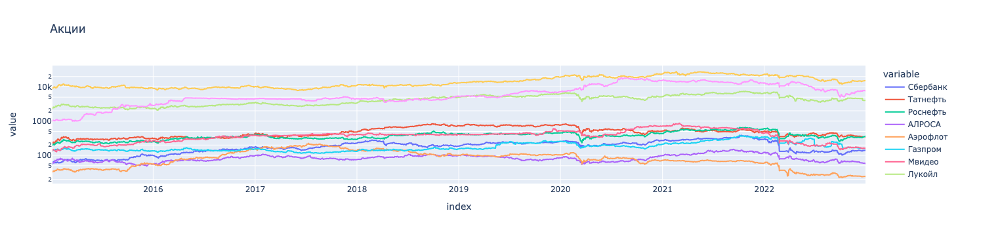

In [7]:
get_instrument_graph(df_stocks, title = 'Акции', log_y = True)

## Облигации

In [8]:
df_bonds = get_instrument_data(bonds, '2015-01-01', '2023-01-01', 'CLOSE')
df_bonds.head(10)

,ОФЗ-26207,ОФЗ-26212,ОФЗ-26215,ОФЗ-26218,ОФЗ-26219
2015-01-05 00:00:00,64.0001,59.0,NaN,NaN,NaN
2015-01-06 00:00:00,64.0001,59.0,NaN,NaN,NaN
2015-01-08 00:00:00,64.0001,59.0,NaN,NaN,NaN
2015-01-09 00:00:00,64.0001,59.0,NaN,NaN,NaN
2015-01-12 00:00:00,67.9000,59.0,NaN,NaN,NaN
2015-01-13 00:00:00,64.0000,57.0,NaN,NaN,NaN
2015-01-14 00:00:00,60.0001,59.0,NaN,NaN,NaN
2015-01-15 00:00:00,67.7500,59.0,NaN,NaN,NaN
2015-01-16 00:00:00,67.7500,60.0,NaN,NaN,NaN
2015-01-19 00:00:00,67.7500,60.0,NaN,NaN,NaN


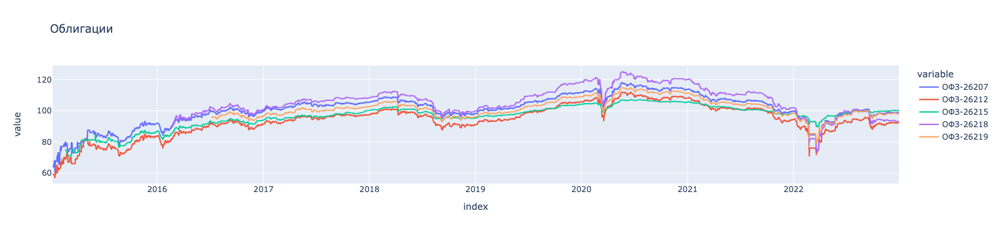

In [9]:
get_instrument_graph(df_bonds, title = 'Облигации')

## Валюта

In [10]:
df_currencies = get_instrument_data(currencies, '2015-01-01', '2023-01-01', 'CLOSE')
df_currencies.head(10)

,Евро,Доллар
2015-01-05 00:00:00,72.7000,60.8500
2015-01-06 00:00:00,74.9085,63.2400
2015-01-08 00:00:00,71.6000,60.3010
2015-01-09 00:00:00,72.2510,61.5500
2015-01-12 00:00:00,74.6850,63.1700
2015-01-13 00:00:00,76.9900,65.2500
2015-01-14 00:00:00,76.2700,64.7730
2015-01-15 00:00:00,75.8100,65.2900
2015-01-16 00:00:00,75.2470,65.1985
2015-01-19 00:00:00,75.3990,65.0200


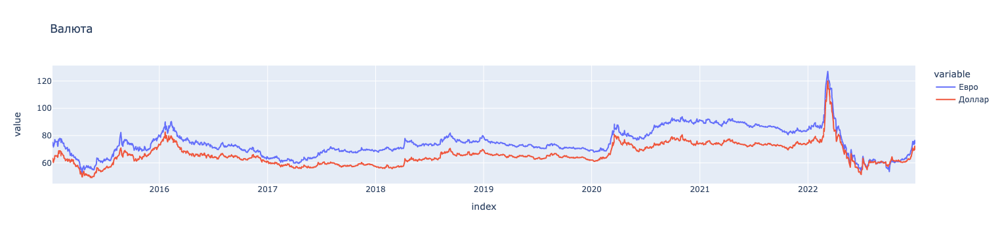

In [11]:
px.line(df_currencies, title='Валюта')

## Риск-факторы

In [12]:
df_risk_factors = get_instrument_data(risk_factors, '2015-01-01', '2023-01-01', 'Adj Close', risk_factor = True)
df_risk_factors = price_usd_to_rub(df_risk_factors, df_risk_factors.columns.difference(['USD/RUB','Индекс мосбиржи']), 'USD/RUB')
df_risk_factors.head(10)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,Нефть,Газ,Золото,Палладий,Серебро,Алюминий,Платина,USD/RUB,Индекс мосбиржи
Date,,,,,,,,,
2015-01-02,3290.696436,175.149979,69185.113057,46359.625432,917.685574,126477.764154,70164.975918,58.325001,NaN
2015-01-05,3120.212536,169.317498,70735.000000,46600.500717,950.516300,126209.687500,71093.373566,58.750000,NaN
2015-01-06,3108.515145,178.724416,74178.543178,48689.934871,1009.993747,130454.225571,74263.709464,60.832001,NaN
2015-01-07,3230.634089,181.332363,76467.808731,50051.142650,1042.771612,136741.399670,77099.408730,63.160000,NaN
2015-01-08,3192.644020,183.376557,75712.526844,49687.714681,1024.390164,138002.290861,76539.503805,62.650002,NaN
2015-01-09,3019.127537,177.496506,73270.023529,48209.038971,987.256481,131887.250000,74053.273529,60.250000,NaN
2015-01-12,2913.624933,171.696856,75730.907376,50010.161749,1015.745046,135007.783171,76197.773878,61.430000,NaN
2015-01-13,2943.789224,185.953464,77995.567238,51540.006391,1082.043149,138343.560507,78816.972256,63.185001,NaN
2015-01-14,3173.857442,210.743100,80470.879486,50886.669936,1105.276778,141549.222198,80725.102568,65.184998,NaN


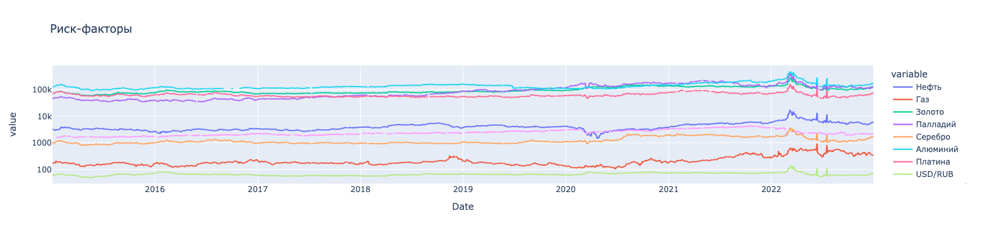

In [13]:
px.line(df_risk_factors, title='Риск-факторы', log_y = True)

## Additional - factors
- Нет возможности пока их достать
- В процессе

# Задание - 2: PCA
- Обязательно использовать анализ главных компонент или факторный анализ для уменьшения количества факторов.
- Если выбраны риск-факторы, данных по которым нет среди предоставленных, то найти или рассчитать необходимые данные.
- Визуализировать историю значений риск-факторов, построить описательную статистику, включая (но не ограничиваясь):
    - корреляции риск-факторов;
    - «тяжесть хвостов» распределений;
    - тренд, сезонность, стационарность.

### Визуализируем историю значений риск-факторов

In [14]:
from typing import Union
from numpy import ndarray
from pandas import DataFrame
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets

from scipy import stats
import statsmodels.api as sm

class VisualStatistics:
    """
    Класс для визуализации статистического анализа данных. 
    Предполагается, что данные представлены в виде ndarray или DataFrame.
    """

    def __init__(self, X: Union[ndarray, DataFrame]):
        """
        Конструктор класса. Принимает на вход данные и преобразует их в DataFrame, если это необходимо.

        Аргументы:
            X : ndarray или DataFrame
                Данные для анализа.
        """
        self.data = X if isinstance(X, pd.DataFrame) else pd.DataFrame(X)

    def correlations(self):
        """
        Метод, отображающий корреляционную матрицу данных с помощью heatmap.

        Возвращает:
            None
        """
        corr_matrix = self.data.corr()
        sns.heatmap(corr_matrix, annot=True)
        plt.show()

    def tail_heaviness(self):
        """
        Метод, оценивающий "тяжесть хвостов" распределения каждого столбца в данных. 
        Для каждого столбца рассчитываются коэффициенты асимметрии и эксцесса, 
        затем выводится описание характера распределения и график.
        Использует выпадающее меню для выбора столбца.

        Возвращает:
            None
        """

        @widgets.interact(column=self.data.columns)
        def plot_column(column):
            skewness, kurtosis = self.data[column].skew(), self.data[column].kurtosis()
            cv = self.data[column].std() / self.data[column].mean()  # Коэффициент вариации

            # Определение тяжести хвостов на основе скоса, эксцесса и других критериев
            tail_description = ""
            if skewness == 0 and kurtosis == 0:
                tail_description += "Нормальное распределение без тяжелых хвостов\n"
            else:
                if skewness < 0 and kurtosis < 0:
                    tail_description += "Тяжелые хвосты как слева, так и справа\n"
                elif skewness < 0:
                    tail_description += "Тяжелый левый хвост\n"
                elif skewness > 0 and kurtosis < 0:
                    tail_description += "Тяжелый правый хвост\n"
                elif skewness > 0 and kurtosis > 0:
                    tail_description += "Более острые пики и более тяжелые хвосты\n"
                else:
                    tail_description += "Нет тяжелых хвостов\n"

                if cv > 1:
                    tail_description += "Большой коэффициент вариации: возможно, тяжелые хвосты\n"

            print(f"У фактора {column} - {tail_description}")

            # График распределения
            plt.figure(figsize=(8, 6))
            plt.hist(self.data[column], bins=20)
            plt.xlabel(column)
            plt.ylabel('Частота')
            plt.title(f"Распределение {column}")
            plt.show()

    def trend_seasonality_stationarity(self):
        """
        Метод, анализирующий тренд, сезонность и стационарность временного ряда для каждого столбца в данных.
        Использует выпадающее меню для выбора столбца.

        Возвращает:
            None
        """

        @widgets.interact(column=self.data.columns)
        def plot_column(column):
            decomposition = sm.tsa.seasonal_decompose(self.data[column], model='additive', period=1)
            decomposition.plot()
            plt.show()

            # Проверка стационарности с использованием теста Дики-Фуллера
            result = sm.tsa.stattools.adfuller(self.data[column])
            print(f'ADF Statistic for {column}: {result[0]}')
            print(f'p-value: {result[1]}')
            print("Стационарный ряд" if result[1] <= 0.05 else "Нестационарный ряд")

            


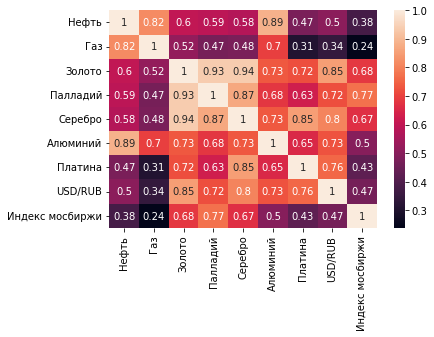

In [15]:
stats = VisualStatistics(df_risk_factors.bfill())

stats.correlations()

In [16]:
stats.tail_heaviness()

interactive(children=(Dropdown(description='column', options=('Нефть', 'Газ', 'Золото', 'Палладий', 'Серебро',…

In [17]:
stats.trend_seasonality_stationarity()

interactive(children=(Dropdown(description='column', options=('Нефть', 'Газ', 'Золото', 'Палладий', 'Серебро',…

In [18]:
df_portfolio = pd.merge(df_stocks, df_bonds, left_index=True, right_index=True, how = 'outer')
df_portfolio = pd.merge(df_portfolio, df_currencies, left_index=True, right_index=True, how = 'outer')
df_portfolio = df_portfolio.bfill()

df_risk_factors_new = pd.DataFrame()
df_risk_factors_new.index = df_portfolio.index[1:]
df_risk_factors_new = pd.merge(df_risk_factors_new, df_risk_factors, left_index = True, right_index = True, how = 'left')

### PCA - метод для отбора факторов

In [19]:
from typing import Union
from numpy import ndarray
from pandas import DataFrame
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

class Importance:
    """
    Класс для проведения анализа главных компонент (PCA) над данными. 
    Предполагается, что данные представлены в виде ndarray или DataFrame. 
    """

    def fit(self, X: Union[ndarray, DataFrame]):
        """
        Метод, подготавливающий данные для анализа PCA. 

        Аргументы:
            X : ndarray или DataFrame
                Данные для анализа.

        Возвращает:
            None
        """
        scaler = StandardScaler()
        self.X = X
        self.X_std = scaler.fit_transform(self.X)

    def components_graph(self):
        """
        Метод, строящий график, отображающий объясненную дисперсию в зависимости от количества главных компонент.

        Возвращает:
            plt.graph() 
        """
        self.pca = PCA().fit(self.X_std)
        self.cumulative_variance = np.cumsum(self.pca.explained_variance_ratio_)
        print(self.cumulative_variance)
        plt.figure()
        plt.plot(self.cumulative_variance)
        plt.xlabel('Количество главных компонент')
        plt.ylabel('Дисперсия (%)') # for each component
        plt.title('Обьясненная дисперсия')
        plt.show()

    def apply_pca(self,*, variance_threshold=0.95):
        """
        Метод, применяющий анализ PCA к подготовленным данным. 

        Аргументы:
            variance_threshold : float, необязательный
                Порог дисперсии, который нужно объяснить. По умолчанию равен 0.95.

        Возвращает:
            X_pca : ndarray
                Преобразованные данные после применения PCA.
        """
        self.n_components_ = np.argmax(self.cumulative_variance >= variance_threshold) + 1
        print(f'Количество полученных компонент - {self.n_components_}')
        # Создание нового экземпляра PCA с выбранным количеством компонент и повторное применение
        pca = PCA(n_components=self.n_components_)
        X_pca = pca.fit_transform(self.X_std)
    
        return X_pca


- На основе полученного графика мы выбрали 4 главные компоненты, так как они обьясняют около 95% общей дисперсии

[0.68256537 0.82559011 0.90384575 0.93865161 0.97087196 0.98556451
 0.9927909  0.99813217 1.        ]

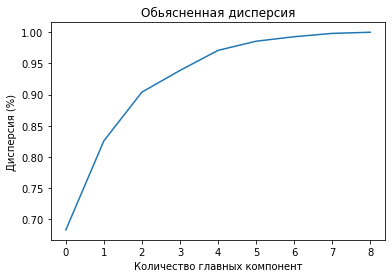

In [20]:
# Создаем экземпляр класса Importance
importance = Importance()

# Теперь вызываем метод fit для этого экземпляра
importance.fit(X = df_risk_factors_new.bfill())

# Нарисуем зависимость обьясненной дисперсии от кол-ва компонент
graph = importance.components_graph()

Мы видим, что уже 5 компонент дают вклад больше 97% обьясненной дисперсии. Таким образом, остановимся на данной отметке

In [21]:
pca_risks = importance.apply_pca(variance_threshold=0.97)
pca_risks

Количество полученных компонент - 5

array([[-1.57273693,  0.01069595,  1.44224251, -0.33917964, -0.77342549],
       [-1.30280618,  0.00688767,  1.63754789, -0.40970664, -0.70444987],
       [-1.64822484,  0.0196986 ,  1.41378848, -0.36815278, -0.7815838 ],
       ...,
       [ 2.01468509,  0.85981505,  0.73515693,  0.54360845, -0.38459506],
       [ 2.58730335,  0.71906349,  1.02351134,  0.52018594, -0.37263448],
       [ 2.86595394,  0.73693806,  1.20083248,  0.40066498, -0.39249227]])

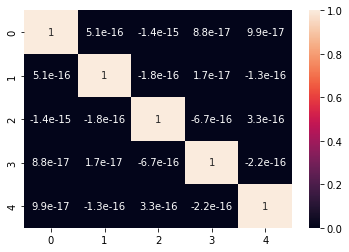

In [22]:
pca_data = VisualStatistics(pca_risks)

pca_data.correlations()

In [23]:
pca_data.tail_heaviness()

interactive(children=(Dropdown(description='column', options=(0, 1, 2, 3, 4), value=0), Output()), _dom_classe…

In [24]:
pca_data.trend_seasonality_stationarity()

interactive(children=(Dropdown(description='column', options=(0, 1, 2, 3, 4), value=0), Output()), _dom_classe…

Создаем табличку с главными компонентами из риск-факторов:

In [25]:
pca_risks = pd.DataFrame(pca_risks)
pca_risks.columns = [f'pca_risk{i}' for i in range(5)]
pca_risks.index = df_risk_factors_new.index

# Задание - 3: VaR-модель

## Весь портфель

### Горизонт планирования 1 день

In [26]:
from var_model import *

v = VaRModel(df_portfolio, pca_risks, df_portfolio.columns, horizon = 1)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1763/1763 [05:50<00:00,  5.03it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

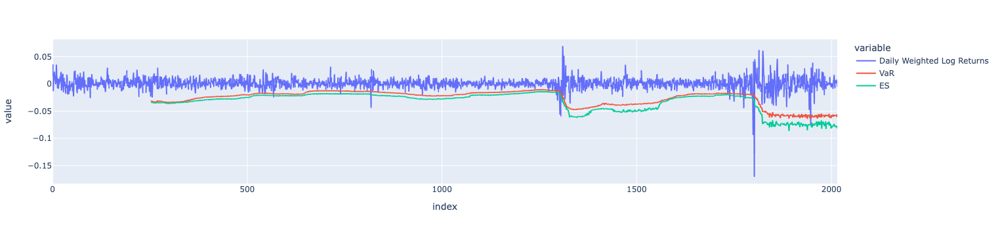

<Figure size 1152x576 with 0 Axes>

In [28]:
v.plot_VaR_ES()

Так же вытащим справедливые стоимости активов портфеля и изобразим для примера исторические данные по Сбербанку и предсказанную справедливую стоимость:

In [29]:
fair_prices = v.get_all_fair_prices()

100%|███████████████████████████████████████| 1763/1763 [00:30<00:00, 57.13it/s]


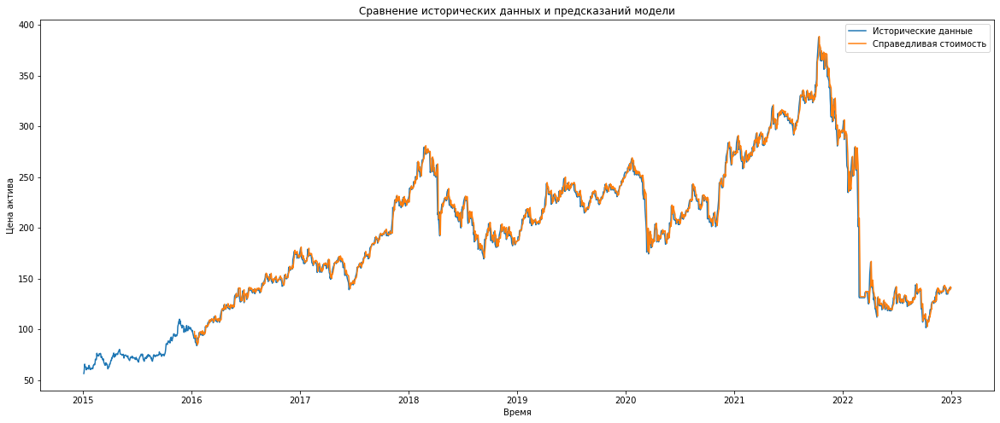

In [30]:
plt.figure(figsize = (20, 8))
plt.plot(df_portfolio['Сбербанк'], label = 'Исторические данные')
plt.plot(fair_prices['Сбербанк'], label = 'Справедливая стоимость')
plt.xlabel('Время')
plt.ylabel('Цена актива')
plt.title('Сравнение исторических данных и предсказаний модели')
plt.legend()
plt.show()

Перейдем к бэктестам:

In [31]:
v.backtest()

Number of violations:  28

Target share of violations: 1.00%

Observed share of violations: 1.59%

Test for coverage: Not Passed

Test for independence: Not Passed

In [32]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

Тут для примера выведем PnL, Value-at-Risk и Violation:

In [33]:
df

,PnL,VaR,Violation
253,0.011988,-0.030753,0
254,-0.000594,-0.032500,0
255,-0.006066,-0.031765,0
256,-0.024102,-0.032197,0
257,-0.001121,-0.032178,0
...,...,...,...
2011,0.003217,-0.057542,0
2012,0.003213,-0.059240,0
2013,0.001270,-0.059181,0
2014,0.006895,-0.055739,0


In [34]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

0.2.2
Normalizing returns...


 47%|██████████████████▊                     | 710/1511 [00:14<00:17, 45.06it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


 47%|██████████████████▉                     | 715/1511 [00:14<00:17, 44.83it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The o

Optimizing...

Elapsed time: 0.9715957641601562 s


{'solution': Result(parameters=[3.0765193907557213, 2.641570642243927], obj_value=180.73150162596158, converged=True),
 'ull': -180.73150162596158,
 'rll': -224.46976711150344,
 'LR': 87.47653097108372,
 'chi square test': 0.0,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [35]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 5.227475823833984,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [36]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    90.54721
p-value       0.00000
Name: DQ, dtype: float64

In [37]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic       p-value
Unconditional  58.141460  2.442491e-14
Independence   21.972391  2.766009e-06
Conditional    80.113851  0.000000e+00

In [38]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -147.867548
p-value        1.000000
Name: Haas Test, dtype: float64

In [39]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3293.7
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [40]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 120.30000000000034
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [41]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 44.16129032258065
Test p-value: 0.0022283066651859196
Null Hypothesis H0: Rejected


In [42]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -2891.747200750698
Test p-value: 0.0
Null Hypothesis H0: Rejected


### Горизонт планирования 10 дней

In [43]:
v = VaRModel(df_portfolio, pca_risks, df_portfolio.columns, horizon = 10)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1754/1754 [06:02<00:00,  4.83it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

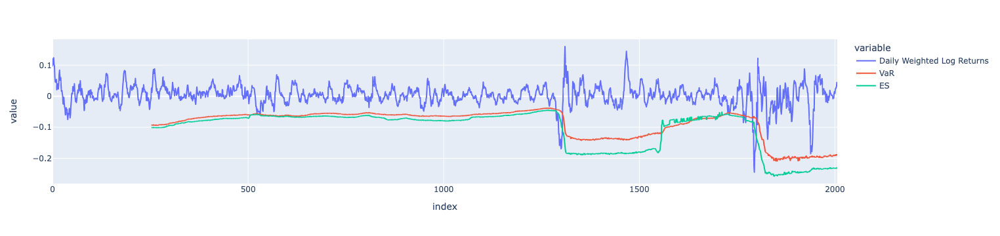

<Figure size 1152x576 with 0 Axes>

In [44]:
v.plot_VaR_ES()

Перейдем к бэктестам:

In [45]:
v.backtest()

Number of violations:  35

Target share of violations: 1.00%

Observed share of violations: 2.00%

Test for coverage: Not Passed

Test for independence: Not Passed

In [46]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [48]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


100%|███████████████████████████████████████| 1502/1502 [00:15<00:00, 98.82it/s]


Optimizing...

Elapsed time: 0.4751880168914795 s


{'solution': Result(parameters=[2.3198292548293256, 1.904360233186519], obj_value=70.96152765997684, converged=True),
 'ull': -70.96152765997684,
 'rll': -74.82781985312988,
 'LR': 7.732584386306087,
 'chi square test': 0.020935851786232362,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [49]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 13.61663584809284,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [50]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    503.173721
p-value        0.000000
Name: DQ, dtype: float64

In [51]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic       p-value
Unconditional   42.687011  6.423739e-11
Independence   217.159156  0.000000e+00
Conditional    259.846166  0.000000e+00

In [52]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -363.684902
p-value        1.000000
Name: Haas Test, dtype: float64

In [53]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3262.6
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [54]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 105.40000000000019
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [55]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 2806.230769230769
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [56]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -5119.4991599407
Test p-value: 0.0
Null Hypothesis H0: Rejected


## Акции

### Горизонт планирования 1 день

In [57]:
v = VaRModel(df_portfolio, pca_risks, df_stocks.columns, horizon = 1)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1763/1763 [02:11<00:00, 13.41it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

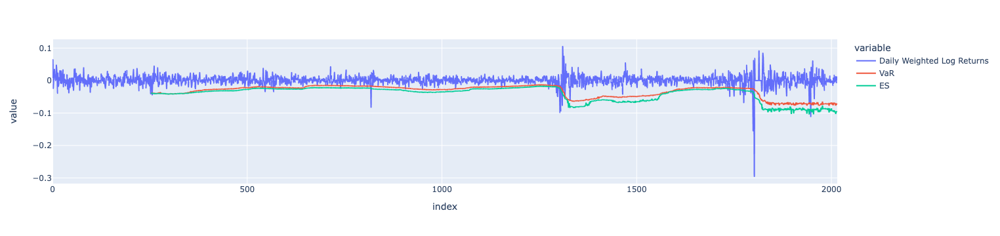

<Figure size 1152x576 with 0 Axes>

In [58]:
v.plot_VaR_ES()

Перейдем к бэктестам:

In [59]:
v.backtest()

Number of violations:  40

Target share of violations: 1.00%

Observed share of violations: 2.27%

Test for coverage: Not Passed

Test for independence: Not Passed

In [60]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [62]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


100%|███████████████████████████████████████| 1511/1511 [00:15<00:00, 94.98it/s]


Optimizing...

Elapsed time: 0.570054292678833 s


{'solution': Result(parameters=[3.7784421924266223, 2.9981837094017467], obj_value=189.8661643348429, converged=True),
 'ull': -189.8661643348429,
 'rll': -253.49692968960528,
 'LR': 127.26153070952478,
 'chi square test': 0.0,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [63]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 21.09014049968303,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [64]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    91.622598
p-value       0.000000
Name: DQ, dtype: float64

In [65]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic       p-value
Unconditional  34.401669  4.483386e-09
Independence   27.623272  1.473947e-07
Conditional    62.024941  3.397282e-14

In [66]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -194.234609
p-value        1.000000
Name: Haas Test, dtype: float64

In [67]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3269.7
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [68]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 96.29999999999998
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [69]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 16.095238095238095
Test p-value: 0.9819226230376653
Null Hypothesis H0: Failed to reject


In [70]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -1517.2132360199128
Test p-value: 0.0
Null Hypothesis H0: Rejected


### Горизонт планирования 10 дней

In [71]:
v = VaRModel(df_portfolio, pca_risks, df_stocks.columns, horizon = 10)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1754/1754 [02:12<00:00, 13.21it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

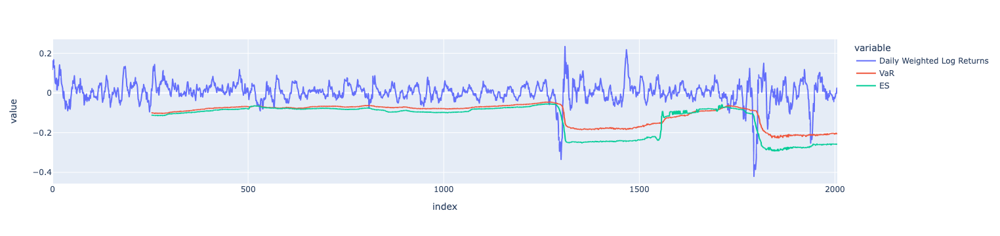

<Figure size 1152x576 with 0 Axes>

In [72]:
v.plot_VaR_ES()

Перейдем к бэктестам:

In [73]:
v.backtest()

Number of violations:  56

Target share of violations: 1.00%

Observed share of violations: 3.19%

Test for coverage: Not Passed

Test for independence: Not Passed

In [74]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [76]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


 34%|█████████████▍                          | 506/1502 [00:05<00:10, 91.54it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


 39%|███████████████                        | 580/1502 [00:06<00:08, 107.72it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


 69%|███████████████████████████            | 1041/1502 [00:11<00:04, 97.51it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


 

Optimizing...

Elapsed time: 0.4997518062591553 s


{'solution': Result(parameters=[3.0345244626806, 2.1340166616464953], obj_value=60.65929919013522, converged=True),
 'ull': -60.65929919013522,
 'rll': -65.90810274729456,
 'LR': 10.497607114318683,
 'chi square test': 0.005253800512346585,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [77]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 53.9553740004974,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [78]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    709.67849
p-value        0.00000
Name: DQ, dtype: float64

In [79]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic   p-value
Unconditional   13.721743  0.000212
Independence   294.770458  0.000000
Conditional    308.492201  0.000000

In [80]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -462.076637
p-value        1.000000
Name: Haas Test, dtype: float64

In [81]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3220.6
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [82]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 63.4000000000003
Test p-value: 1.6653345369377348e-15
Null Hypothesis H0: Rejected


In [83]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 106.57894736842105
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [84]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -1849.1477024285928
Test p-value: 0.0
Null Hypothesis H0: Rejected


## Облигации

### Горизонт планирования 1 день

In [85]:
v = VaRModel(df_portfolio, pca_risks, df_bonds.columns, horizon = 1)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1763/1763 [01:05<00:00, 26.99it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

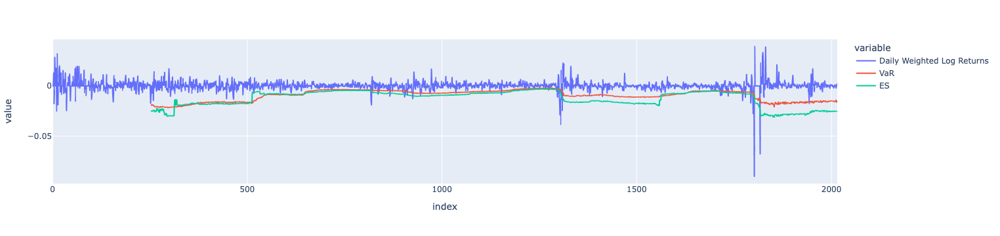

<Figure size 1152x576 with 0 Axes>

In [86]:
v.plot_VaR_ES()

Так же вытащим справедливые стоимости активов портфеля и изобразим для примера исторические данные по Сбербанку и предсказанную справедливую стоимость:

In [87]:
fair_prices = v.get_all_fair_prices()

100%|██████████████████████████████████████| 1763/1763 [00:13<00:00, 132.06it/s]


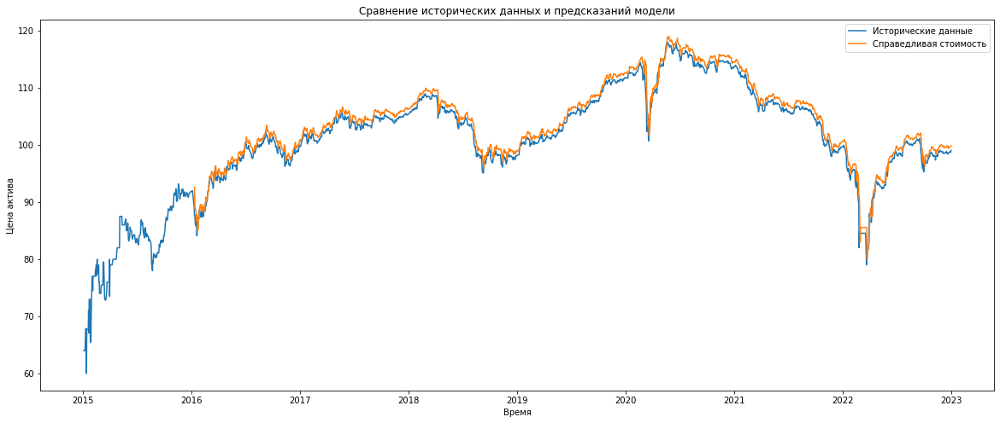

In [88]:
plt.figure(figsize = (20, 8))
plt.plot(df_portfolio['ОФЗ-26207'], label = 'Исторические данные')
plt.plot(fair_prices['ОФЗ-26207'], label = 'Справедливая стоимость')
plt.xlabel('Время')
plt.ylabel('Цена актива')
plt.title('Сравнение исторических данных и предсказаний модели')
plt.legend()
plt.show()

Перейдем к бэктестам:

In [89]:
v.backtest()

Number of violations:  50

Target share of violations: 1.00%

Observed share of violations: 2.84%

Test for coverage: Not Passed

Test for independence: Not Passed

In [90]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [91]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


  8%|██▉                                    | 114/1511 [00:01<00:12, 115.27it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


 11%|████▏                                   | 159/1511 [00:01<00:14, 94.38it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


 11%|████▌                                   | 170/1511 [00:01<00:14, 90.27it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/Users/grigoryan/opt/anaconda3/lib/python3.9/s

Optimizing...

Elapsed time: 0.6019458770751953 s


{'solution': Result(parameters=[3.923407992698283, 2.999923901129213], obj_value=174.7392340278066, converged=True),
 'ull': -174.7392340278066,
 'rll': -268.3369270042747,
 'LR': 187.1953859529362,
 'chi square test': 0.0,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [92]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 40.10618789926424,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [93]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    115.261392
p-value        0.000000
Name: DQ, dtype: float64

In [94]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic       p-value
Unconditional  20.415744  6.231503e-06
Independence   28.208004  1.089531e-07
Conditional    48.623748  2.763678e-11

In [95]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -134.729642
p-value        1.000000
Name: Haas Test, dtype: float64

In [96]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3249.7
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [97]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 76.30000000000032
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [98]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 7.6923076923076925
Test p-value: 0.9999999717066743
Null Hypothesis H0: Failed to reject


In [99]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -1541.422623164443
Test p-value: 0.0
Null Hypothesis H0: Rejected


### Горизонт планирования 10 дней

In [100]:
v = VaRModel(df_portfolio, pca_risks, df_bonds.columns, horizon = 10)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1754/1754 [01:05<00:00, 26.77it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

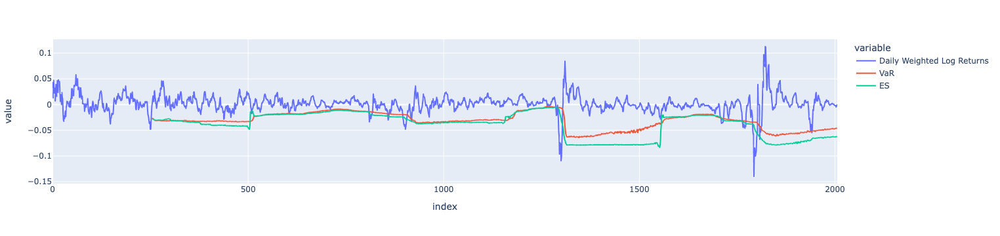

<Figure size 1152x576 with 0 Axes>

In [101]:
v.plot_VaR_ES()

Перейдем к бэктестам:

In [102]:
v.backtest()

Number of violations:  82

Target share of violations: 1.00%

Observed share of violations: 4.68%

Test for coverage: Not Passed

Test for independence: Not Passed

In [103]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [105]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


100%|███████████████████████████████████████| 1502/1502 [00:15<00:00, 99.51it/s]


Optimizing...

Elapsed time: 0.5398521423339844 s


{'solution': Result(parameters=[2.430466388020294, 2.0461704762357575], obj_value=93.7411040370322, converged=True),
 'ull': -93.7411040370322,
 'rll': -100.15568345904754,
 'LR': 12.829158844030673,
 'chi square test': 0.0016375084633416526,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [106]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 126.42960544928627,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [107]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    1145.763173
p-value         0.000000
Name: DQ, dtype: float64

In [108]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is not rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic   p-value
Unconditional    0.391439  0.531544
Independence   438.260671  0.000000
Conditional    438.652110  0.000000

In [109]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -275.922206
p-value        1.000000
Name: Haas Test, dtype: float64

In [110]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3168.6
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [111]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 11.400000000000016
Test p-value: 0.0007344410597854845
Null Hypothesis H0: Rejected


In [112]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 101.25
Test p-value: 3.3306690738754696e-16
Null Hypothesis H0: Rejected


In [113]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -842.0598159995723
Test p-value: 0.0
Null Hypothesis H0: Rejected


## Валюта

### Горизонт планирования 1 день

In [114]:
v = VaRModel(df_portfolio, pca_risks, df_currencies.columns, horizon = 1)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1763/1763 [00:28<00:00, 62.19it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

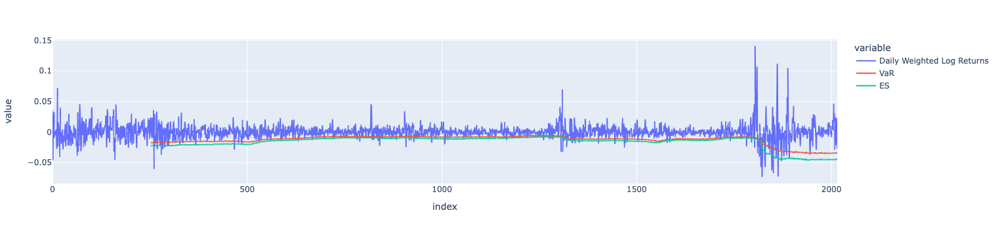

<Figure size 1152x576 with 0 Axes>

In [115]:
v.plot_VaR_ES()

Так же вытащим справедливые стоимости активов портфеля и изобразим для примера исторические данные по Сбербанку и предсказанную справедливую стоимость:

In [116]:
fair_prices = v.get_all_fair_prices()

100%|██████████████████████████████████████| 1763/1763 [00:14<00:00, 122.47it/s]


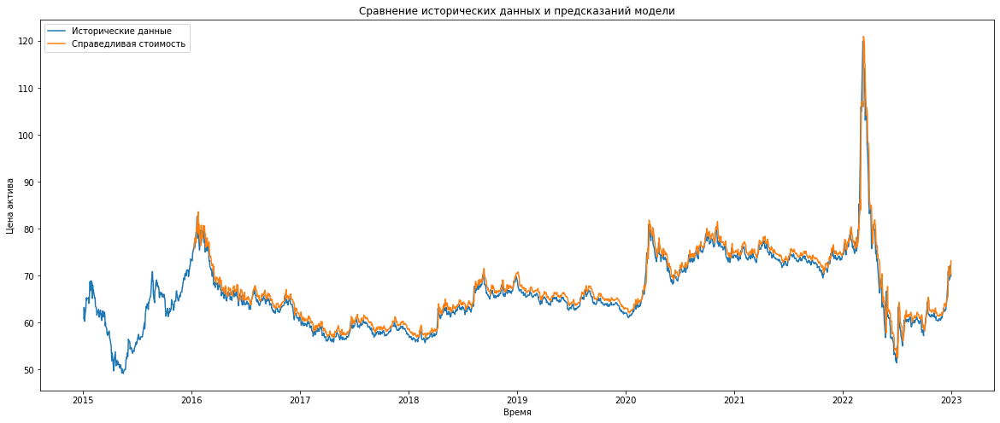

In [117]:
plt.figure(figsize = (20, 8))
plt.plot(df_portfolio['Доллар'], label = 'Исторические данные')
plt.plot(fair_prices['Доллар'], label = 'Справедливая стоимость')
plt.xlabel('Время')
plt.ylabel('Цена актива')
plt.title('Сравнение исторических данных и предсказаний модели')
plt.legend()
plt.show()

Перейдем к бэктестам:

In [118]:
v.backtest()

Number of violations:  137

Target share of violations: 1.00%

Observed share of violations: 7.77%

Test for coverage: Not Passed

Test for independence: Not Passed

In [119]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [120]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


  7%|██▉                                    | 112/1511 [00:00<00:11, 120.68it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


  8%|███▏                                   | 125/1511 [00:01<00:13, 100.01it/s]/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.


/Users/grigoryan/opt/anaconda3/lib/python3.9/site-packages/arch/univariate/base.py:765: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.


100%|███████████████████████████████████████| 1511/1511 [00:15<00:00, 96.66it/s]


Optimizing...

Elapsed time: 0.5105071067810059 s


{'solution': Result(parameters=[1.710125404802143, 1.7132523404179265], obj_value=85.546766180315, converged=True),
 'ull': -85.546766180315,
 'rll': -88.759360021167,
 'LR': 6.425187681703989,
 'chi square test': 0.0402520702824305,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Reject H0'}

In [121]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 331.42058112876146,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [122]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    5.234679e+01
p-value      1.588123e-09
Name: DQ, dtype: float64

In [123]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is not rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic       p-value
Unconditional  24.615943  6.997044e-07
Independence  -14.538202  1.000000e+00
Conditional    10.077741  6.481063e-03

In [124]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -329.77114
p-value        1.00000
Name: Haas Test, dtype: float64

In [125]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3075.7
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [126]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: -97.69999999999979
Test p-value: 1.0
Null Hypothesis H0: Failed to reject


In [127]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 38.02777777777778
Test p-value: 0.9999999999999046
Null Hypothesis H0: Failed to reject


In [128]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -431.82424554590443
Test p-value: 0.0
Null Hypothesis H0: Rejected


### Горизонт планирования 10 дней

In [129]:
v = VaRModel(df_portfolio, pca_risks, df_currencies.columns, horizon = 10)
VaR, ES, VaR_per_asset, ES_per_asset = v.get_VaR_and_ES()

100%|███████████████████████████████████████| 1754/1754 [00:28<00:00, 61.07it/s]


Изобразим дневные средневзвешенные лог-доходности, Value-at-Risk (99%-квантиль предсказаний модели) и Expected Shortfall (97,5%-квантиль условного среднего):

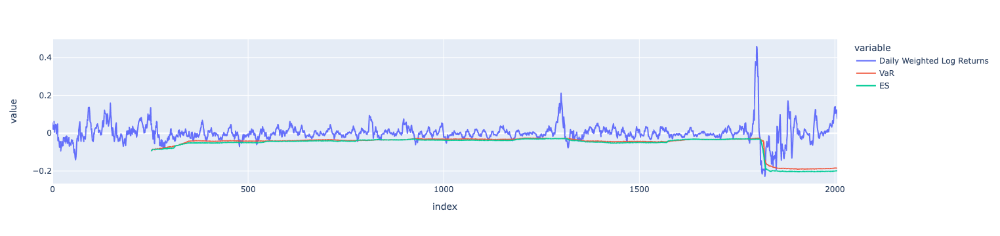

<Figure size 1152x576 with 0 Axes>

In [130]:
v.plot_VaR_ES()

Перейдем к бэктестам:

In [131]:
v.backtest()

Number of violations:  63

Target share of violations: 1.00%

Observed share of violations: 3.59%

Test for coverage: Not Passed

Test for independence: Not Passed

In [132]:
from var_backtests import *
lr = pd.DataFrame((v.df_log_diff_portfolio.to_numpy() * v.w.to_numpy()).sum(axis=1))
var_curve = v.VaR
df = pd.DataFrame([lr.to_numpy().reshape(-1), var_curve]).T
df.columns = ['PnL', 'VaR']
df['Violation'] = (df['PnL'] < df['VaR']).astype('int32')
df = df.dropna()

In [134]:
import vartests

vartests.berkowtiz_tail_test(df[['PnL']], volatility_window=252, var_conf_level=0.99, conf_level=0.95)

Normalizing returns...


100%|██████████████████████████████████████| 1502/1502 [00:13<00:00, 110.47it/s]


Optimizing...

Elapsed time: 0.5253770351409912 s


{'solution': Result(parameters=[0.4960665207534338, 1.1559771086753914], obj_value=65.27550985799225, converged=True),
 'ull': -65.27550985799225,
 'rll': -65.97268680872706,
 'LR': 1.3943539014696285,
 'chi square test': 0.4979891692266679,
 'null hypothesis': 'Distribuition is Normal(0,1)',
 'decision': 'Fail to Reject H0'}

In [135]:
vartests.kupiec_test(df[['Violation']], var_conf_level=0.99, conf_level=0.95)

{'log-likelihood': 71.39064614546675,
 'chi square critical value': 3.841458820694124,
 'null hypothesis': 'Probability of failure is 0.01',
 'result': 'Reject H0'}

In [136]:
alpha_value = 0.05  # Define alpha according to your needs
res = dq_bt(df, alpha_value)
print(res)

Null Hypothesis H0 is rejected


Statistic    584.578816
p-value        0.000000
Name: DQ, dtype: float64

In [137]:
alpha_value = 0.05  # Define alpha according to your needs
res = lr_bt(df, alpha_value)
print(res)

For Unconditional Coverage, Null Hypothesis H0 is rejected
For Independence, Null Hypothesis H0 is rejected
For Conditional Coverage, Null Hypothesis H0 is rejected


Statistic   p-value
Unconditional    8.055747  0.004536
Independence   236.019563  0.000000
Conditional    244.075310  0.000000

In [138]:
haas_df = haas_bt(df)
print(haas_df)

For Unconditional Coverage, Null Hypothesis H0 is not rejected


Statistic   -308.994596
p-value        1.000000
Name: Haas Test, dtype: float64

In [139]:
test_statistic, p_value = dumitrescu_backtest(df)

Test Statistic: 3206.6
Test p-value: 0.0
Null Hypothesis H0 is Rejected


In [140]:
test_statistic, p_value = candelon_backtest(df, confidence_level=0.05)

Test Statistic: 49.40000000000007
Test p-value: 2.0874413309002193e-12
Null Hypothesis H0: Rejected


In [141]:
test_statistic, p_value = colletaz_backtest(df, confidence_level=0.05)

Test Statistic: 480.5
Test p-value: 0.0
Null Hypothesis H0: Rejected


In [142]:
result = pelletier_wei_backtest(df, confidence_level=0.05)

Test Statistic: -610.0750771451145
Test p-value: 0.0
Null Hypothesis H0: Rejected
